In [1]:
import os

import numpy as np

from utils import *
from sklearn.decomposition import PCA
from sklearn.decomposition import KernelPCA
from sklearn.manifold import Isomap, LocallyLinearEmbedding
from sklearn.feature_selection import mutual_info_regression
from matplotlib import pyplot as plt

In [2]:
comparator = Comparator("full_dataset_start=350_interval=100_ndraw=8_size=(64,64)", jupyter=True)

# Principal Component Analysis (PCA)
## All variation

(8, 4, 3200, 2)


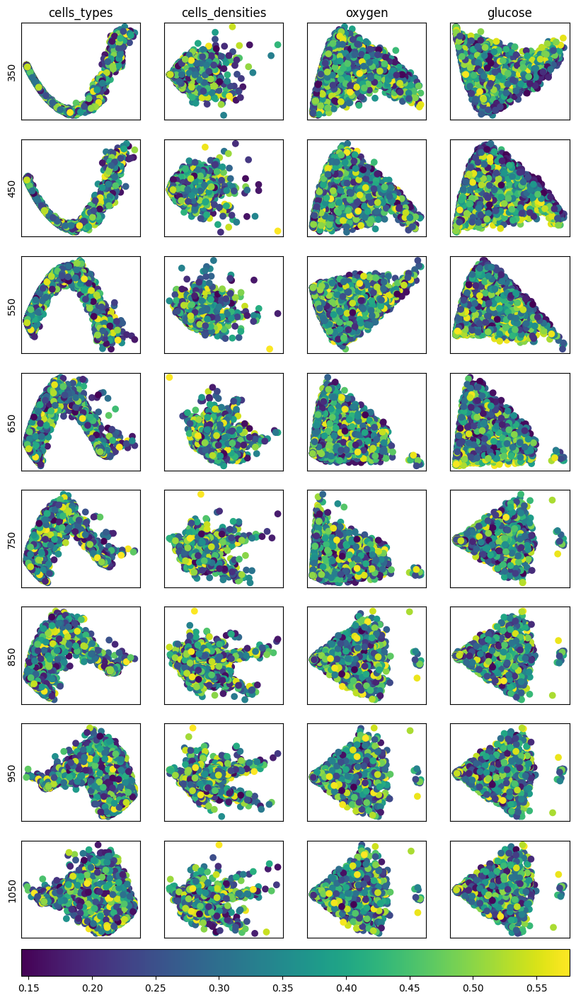

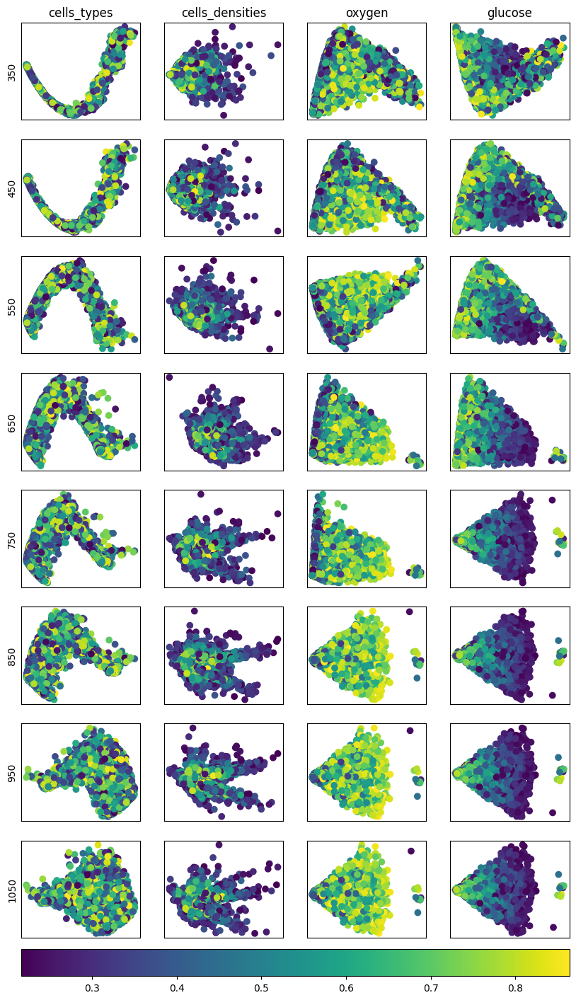

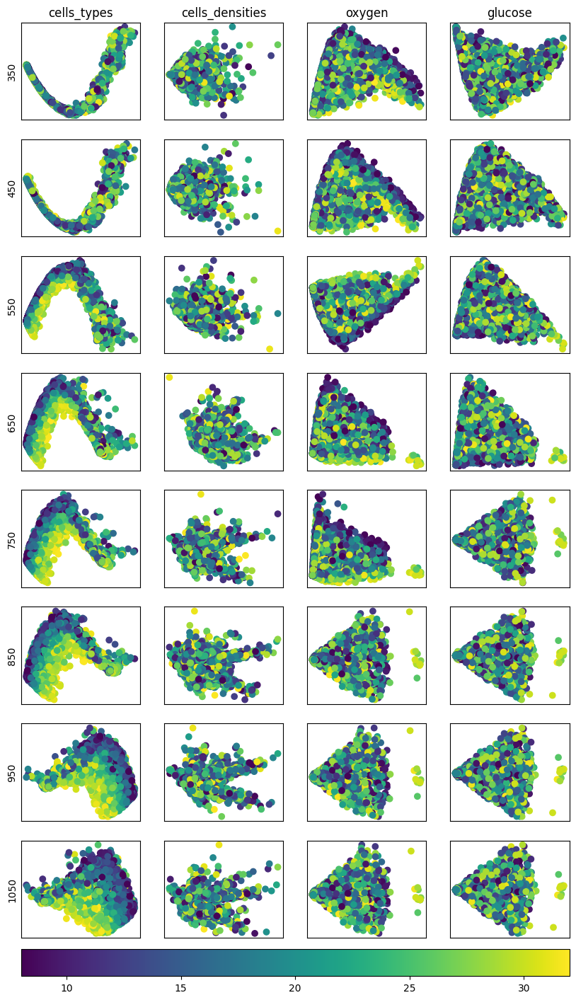

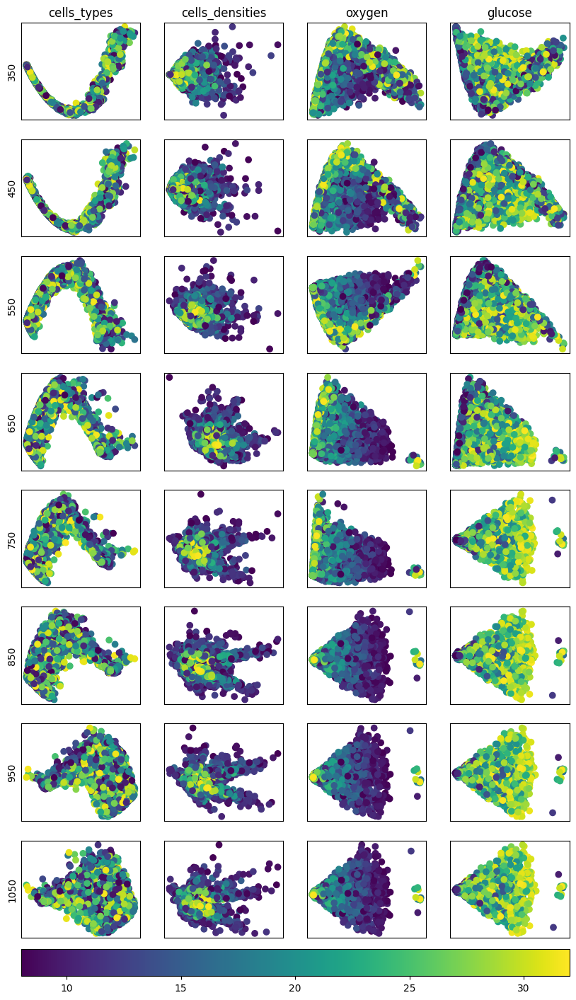

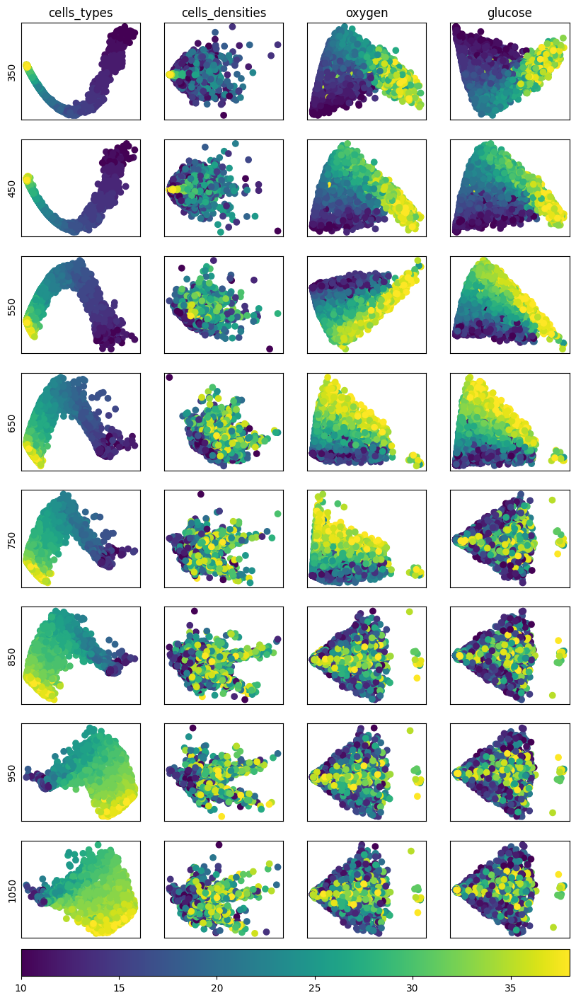

In [3]:
os.makedirs("pca", exist_ok=True)
draws = range(350,1150,100)
image_types = ["cells_types","cells_densities","oxygen","glucose"]
params = [PARAMETERS[1],PARAMETERS[2],PARAMETERS[3],PARAMETERS[4],PARAMETERS[7]]

pca_datas = list()
for i, draw in enumerate(draws):
    pca_datas.append(list())
    for j, image_type in enumerate(image_types):
        data = np.array([comparator.get_item(i, draw, image_type)[0].flatten() for i in range(len(comparator))])
        pca = PCA(n_components=2)
        pca_datas[i].append(pca.fit_transform(data))

targets = {param: np.array([comparator.get_item(i, draws[0], image_types[0])[1][param] for i in range(len(comparator))]) for param in params}
pca_datas = np.array(pca_datas)
print(pca_datas.shape)

im=None
for param in params:
    fig, ax = plt.subplots(8,4, figsize = (10,20))
    for i, draw in enumerate(draws):
        for j, image_type in enumerate(image_types):
            im = ax[i,j].scatter(pca_datas[i][j][:,0],pca_datas[i][j][:,1], c=targets[param])
            
            ax[i,j].xaxis.set_tick_params(labelbottom=False)
            ax[i,j].yaxis.set_tick_params(labelleft=False)
            ax[i,j].set_xticks([])
            ax[i,j].set_yticks([])
                
    for axes, col in zip(ax[0], ["cells_types","cells_densities","oxygen","glucose"]):
        axes.set_title(col)
    
    for axes, row in zip(ax[:,0], range(350,1150,100)):
        axes.set_ylabel(row)
        
    
    cbar = fig.colorbar(im,ax=ax, orientation='horizontal', pad=0.01)
    plt.savefig(os.path.join("pca", f'all_pca_{param}.pdf'),bbox_inches='tight')


## Combined PCA

Lag incoming


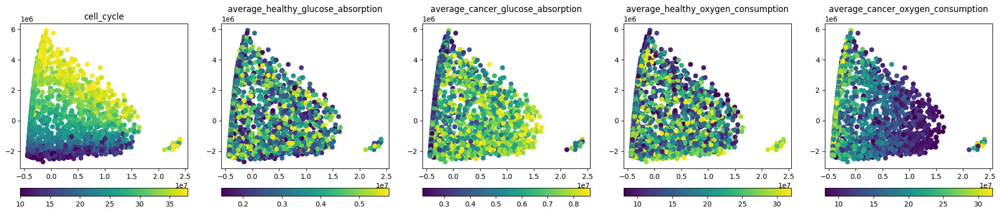

In [4]:
data = list()
draws = range(350,1150,100)
image_types = ["cells_types","cells_densities","oxygen","glucose"]
params = [PARAMETERS[7],PARAMETERS[1],PARAMETERS[2],PARAMETERS[3],PARAMETERS[4]]

for i in range(len(comparator)):
    data.append(np.concatenate([comparator.get_item(i, draw, image_type)[0].flatten() for draw in draws for image_type in image_types]))
data = np.array(data)
pca = PCA(n_components=2)

print("Lag incoming")
pca_data = pca.fit_transform(data)

fig, ax = plt.subplots(1,5, figsize = (25,5))
for i, param in enumerate(params):
    target = np.array([comparator.get_item(i, draws[0], image_types[0])[1][param] for i in range(len(comparator))])
    im = ax[i].scatter(pca_data[:,0],pca_data[:,1], c=target)
    cbar = fig.colorbar(im, orientation='horizontal', pad=0.1)
    ax[i].set_title(param)
plt.savefig(os.path.join("pca", f'all_pca_combined.pdf'),bbox_inches='tight')
    

# Isomap
## All variation

/home/nicolas/.local/lib/python3.10/site-packages/sklearn/manifold/_isomap.py:383: UserWarning: The number of connected components of the neighbors graph is 3 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/home/nicolas/.local/lib/python3.10/site-packages/scipy/sparse/_index.py:100: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/home/nicolas/.local/lib/python3.10/site-packages/scipy/sparse/_index.py:100: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])
/home/nicolas/.local/lib/python3.10/site-packages/scipy/sparse/_index.py:100: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])

(8, 4, 3200, 2)


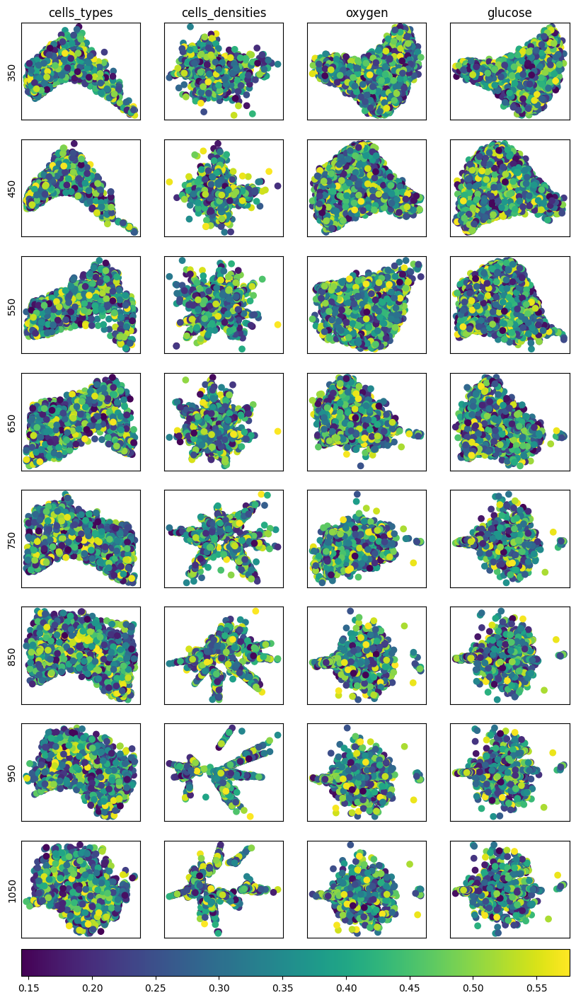

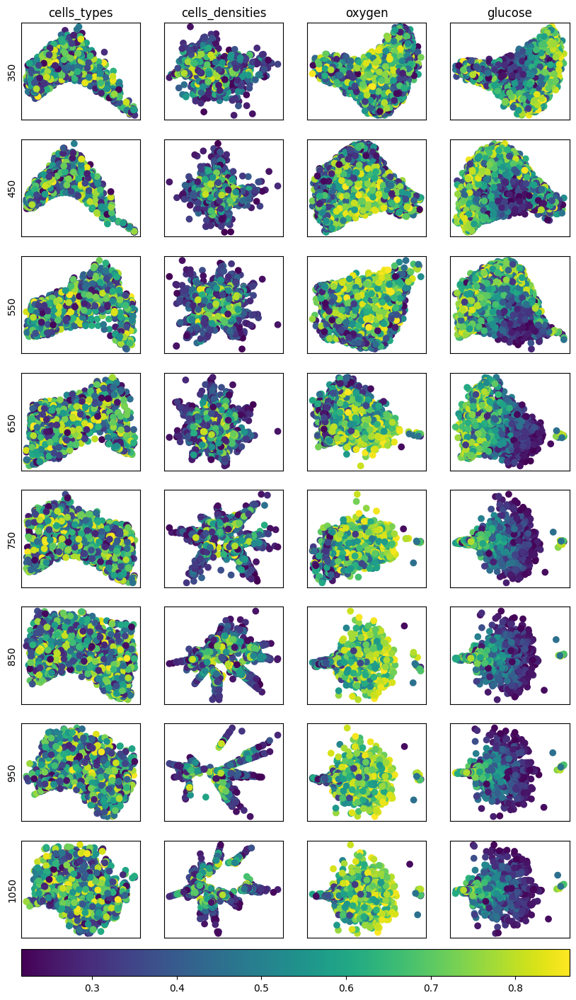

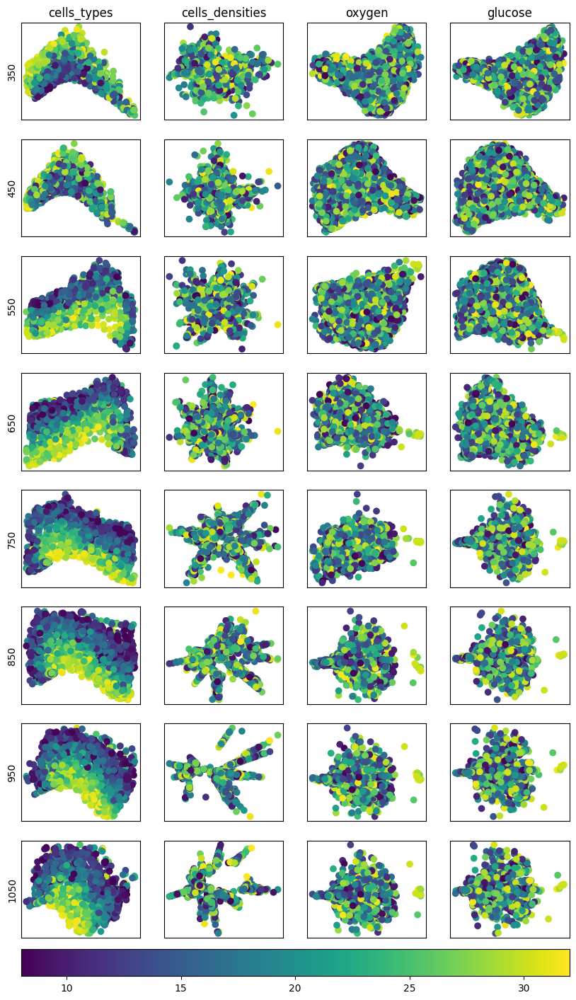

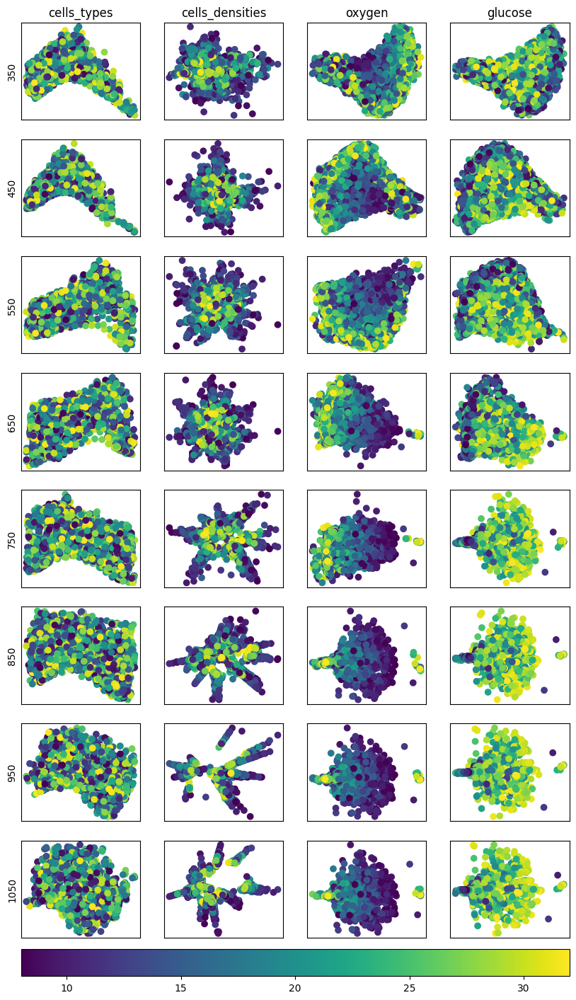

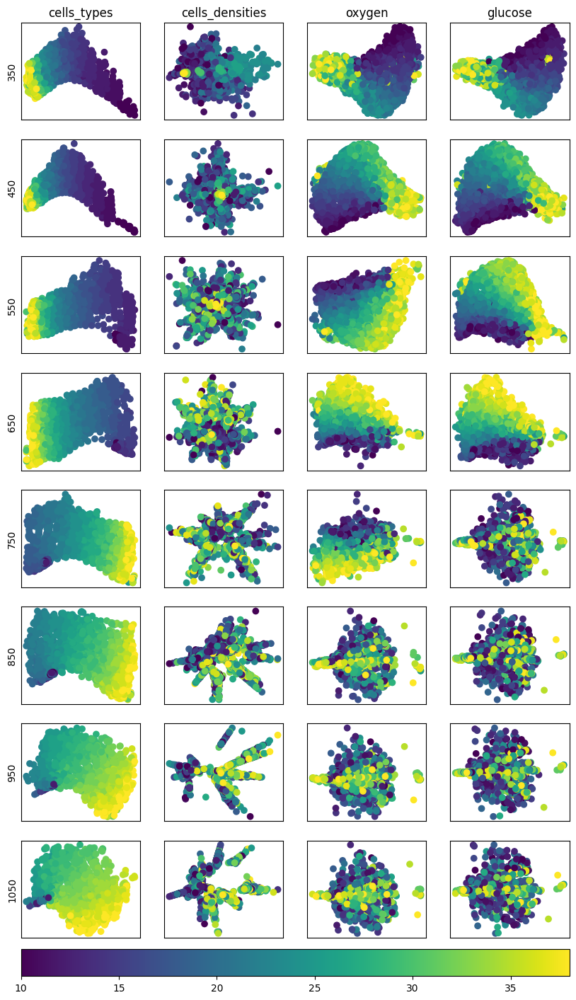

In [5]:
os.makedirs("isomap", exist_ok=True)
draws = range(350,1150,100)
image_types = ["cells_types","cells_densities","oxygen","glucose"]
params = [PARAMETERS[1],PARAMETERS[2],PARAMETERS[3],PARAMETERS[4],PARAMETERS[7]]

isomap_datas = list()
for i, draw in enumerate(draws):
    isomap_datas.append(list())
    for j, image_type in enumerate(image_types):
        data = np.array([comparator.get_item(i, draw, image_type)[0].flatten() for i in range(len(comparator))])
        isomap = Isomap(n_components=2, n_neighbors=15)
        isomap_datas[i].append(isomap.fit_transform(data))

targets = {param: np.array([comparator.get_item(i, draws[0], image_types[0])[1][param] for i in range(len(comparator))]) for param in params}
isomap_datas = np.array(isomap_datas)
print(isomap_datas.shape)

im=None
for param in params:
    fig, ax = plt.subplots(8,4, figsize = (10,20))
    for i, draw in enumerate(draws):
        for j, image_type in enumerate(image_types):
            im = ax[i,j].scatter(isomap_datas[i][j][:,0],isomap_datas[i][j][:,1], c=targets[param])
            
            ax[i,j].xaxis.set_tick_params(labelbottom=False)
            ax[i,j].yaxis.set_tick_params(labelleft=False)
            ax[i,j].set_xticks([])
            ax[i,j].set_yticks([])
                
    for axes, col in zip(ax[0], ["cells_types","cells_densities","oxygen","glucose"]):
        axes.set_title(col)
    
    for axes, row in zip(ax[:,0], range(350,1150,100)):
        axes.set_ylabel(row)
        
    
    cbar = fig.colorbar(im,ax=ax, orientation='horizontal', pad=0.01)
    plt.savefig(os.path.join("isomap", f'all_isomap_{param}.pdf'),bbox_inches='tight')


## Combined Isomap

Lag incoming


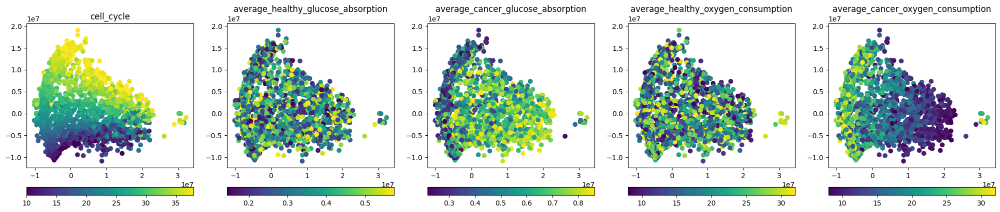

In [6]:
data = list()
draws = range(350,1150,100)
image_types = ["cells_types","cells_densities","oxygen","glucose"]
params = [PARAMETERS[7],PARAMETERS[1],PARAMETERS[2],PARAMETERS[3],PARAMETERS[4]]

for i in range(len(comparator)):
    data.append(np.concatenate([comparator.get_item(i, draw, image_type)[0].flatten() for draw in draws for image_type in image_types]))
data = np.array(data)
isomap = Isomap(n_components=2, n_neighbors=15)

print("Lag incoming")
isomap_data = isomap.fit_transform(data)

fig, ax = plt.subplots(1,5, figsize = (25,5))
for i, param in enumerate(params):
    target = np.array([comparator.get_item(i, draws[0], image_types[0])[1][param] for i in range(len(comparator))])
    im = ax[i].scatter(isomap_data[:,0],isomap_data[:,1], c=target)
    cbar = fig.colorbar(im, orientation='horizontal', pad=0.1)
    ax[i].set_title(param)
plt.savefig(os.path.join("isomap", f'all_isomap_combined.pdf'),bbox_inches='tight')

# Link between the dataset and the target

In [5]:
draws = range(350,1150,100)
image_types = ["cells_types","cells_densities","oxygen","glucose"]
params = [PARAMETERS[7],PARAMETERS[1],PARAMETERS[2],PARAMETERS[3],PARAMETERS[4]]

images = {}
for draw in draws:
    images[draw] = {}
    for image_type in image_types:
        images[draw][image_type] = np.array([comparator.get_item(i, draw, image_type)[0] for i in range(len(comparator))])

targets = {param: np.array([comparator.get_item(i, draws[0], image_types[0])[1][param] for i in range(len(comparator))]) for param in params}

## Mutual information

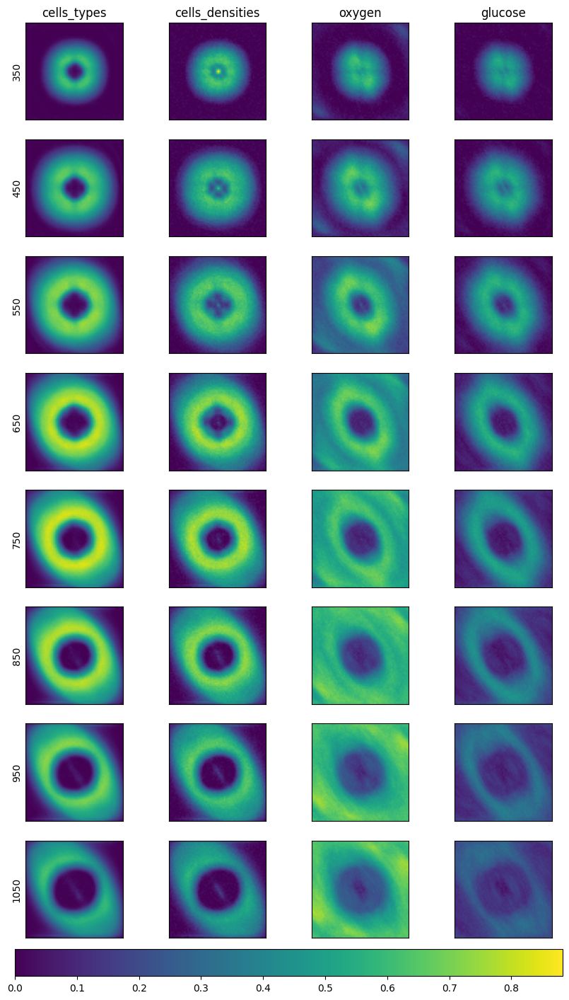

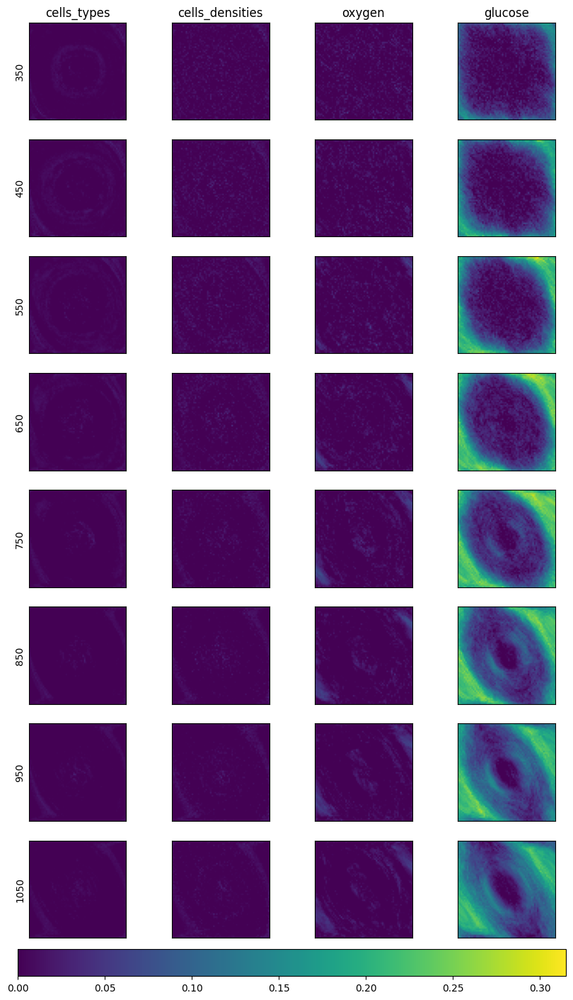

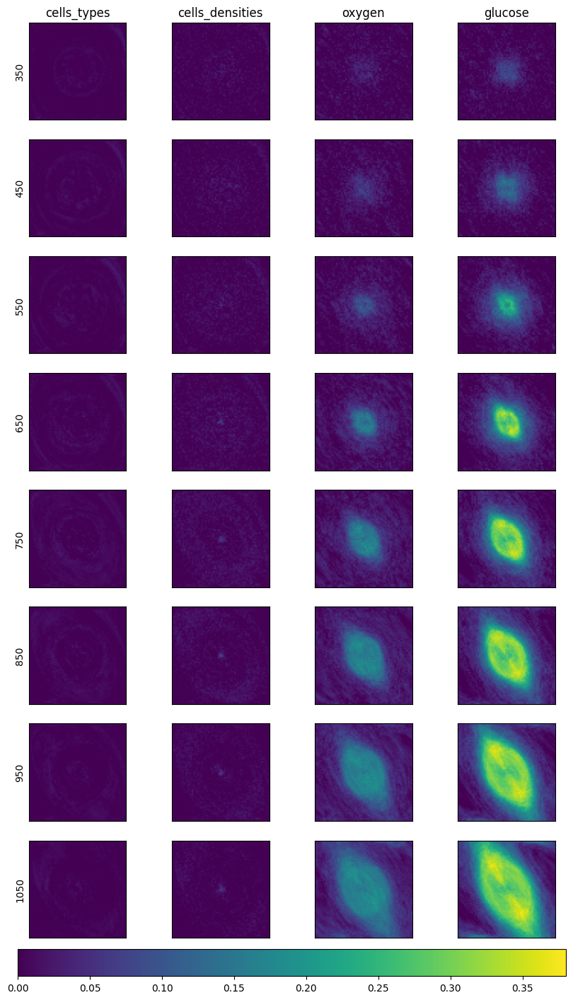

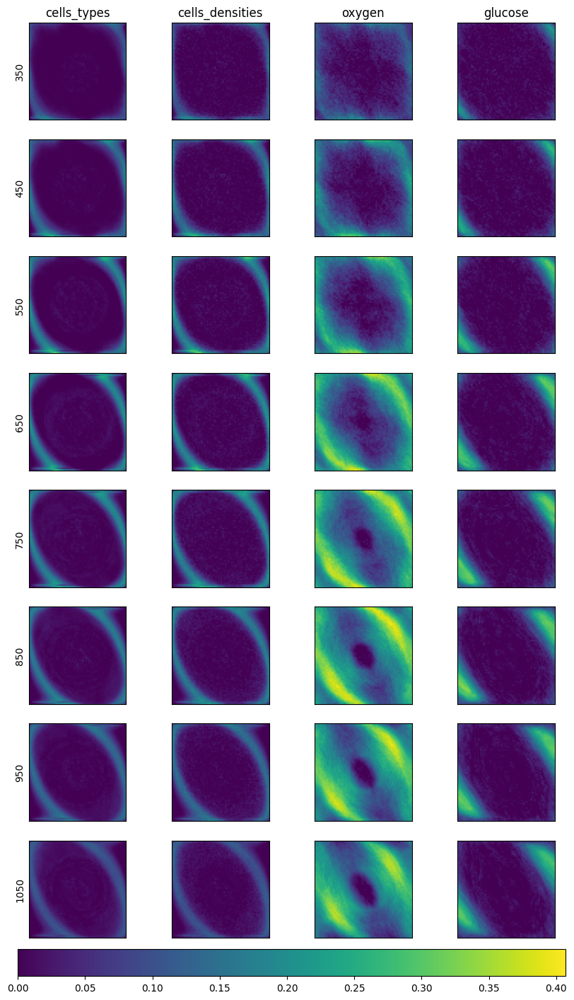

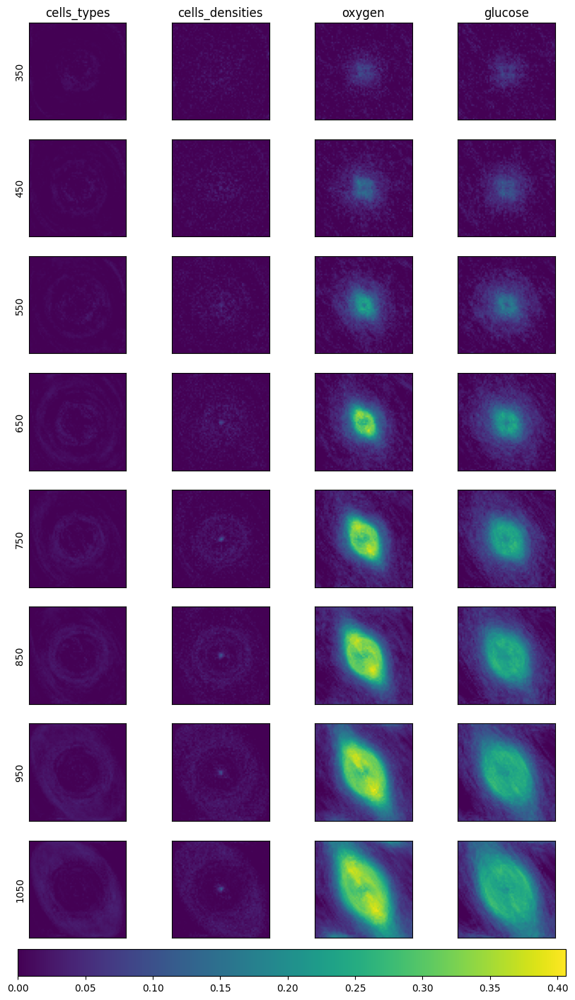

In [39]:
os.makedirs("mutual_information", exist_ok=True)
for param in params:
    fig, ax = plt.subplots(8,4, figsize = (10,20))
    im = None
    mutual_information = {}
    v_min = np.inf
    v_max = -np.inf
    for i, draw in enumerate(draws):
        mutual_information[draw] = {}
        for j, image_type in enumerate(image_types):
            flattened_image = np.array([images[draw][image_type][i].flatten() for i in range(len(comparator))])
            n = int(np.sqrt(len(flattened_image[0])))
            mutual_information[draw][image_type] = mutual_info_regression(flattened_image,targets[param], discrete_features=(image_type == "cells_types")).reshape(n,n)
            #mutual_information[draw][image_type] = np.random.random((n,n))
            v_min = min(v_min, mutual_information[draw][image_type].min())
            v_max = max(v_max, mutual_information[draw][image_type].max())
    for i, draw in enumerate(draws):
        for j, image_type in enumerate(image_types):
            im = ax[i,j].imshow(mutual_information[draw][image_type], vmin=v_min, vmax=v_max)
            ax[i,j].xaxis.set_tick_params(labelbottom=False)
            ax[i,j].yaxis.set_tick_params(labelleft=False)
            ax[i,j].set_xticks([])
            ax[i,j].set_yticks([])
    for axes, col in zip(ax[0], image_types):
        axes.set_title(col)
    
    for axes, row in zip(ax[:,0], draws):
        axes.set_ylabel(row)
    
    cbar = fig.colorbar(im,ax=ax, orientation='horizontal', pad=0.01)
    plt.savefig(os.path.join("mutual_information", f'all_mutual_information_{param}.pdf'),bbox_inches='tight', dpi=400)
